# Import Modules

In [1]:
import scanpy as sc
import squidpy as sq
import sys
sys.path.append(r"/home/yqzhou/JUPYTER/MyPackage/Pianno")
import pianno as po
import json
from os.path import join
import matplotlib.pyplot as plt
import matplotlib as mpl

# Data input

In [2]:
# Setting the data and configuration file storage path.
sample_name = "BRCA-B"
config_path = "/home/yqzhou/JUPYTER/Revision/Tutorials/" + sample_name
adata = sc.read(join(config_path, "pianno_adata.h5ad"))

# (Optional) Step1：Automatic hyper-parameter selection

In [3]:
# Specify a known marker gene for each pattern
# If there is a pattern that does not know its marker gene, it can be set to []
# Allow only one pattern's marker gene to be set to []
Patterndict = {
    'Stroma': ['MMP2'],
    'DCIS': ['SERPINA3'],
    'Invasive': ['FASN'],
    'ACTA2+ Myoepi.': ['ACTA2'],
    'KRT15+ Myoepi.': ['KRT15'],   
    'Endothelial': ['AQP1'],
    'Macrophages': ['CD68'],
    'B Cell': ['CD79A'],
    'T Cell': ['CD8A'],
    'Mast Cell': ['CPA3']
}

Configuration path of Pianno: /home/yqzhou/JUPYTER/Revision/Tutorials/BRCA-B
[2024-01-17 23:44:04] Creating experiment, Experiment ID: lsnptd0j
[2024-01-17 23:44:04] Starting web server...
[2024-01-17 23:44:05] Setting up...
[2024-01-17 23:44:05] Web UI URLs: http://127.0.0.1:8080 http://10.10.10.6:8080 http://11.11.11.6:8080
[2024-01-17 23:54:28] Stopping experiment, please wait...
[2024-01-17 23:54:31] Experiment stopped


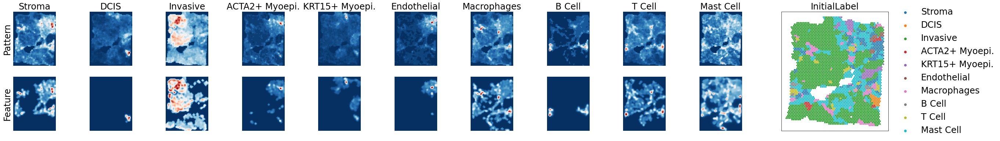

In [4]:
# If the connection fails, try a few more times.
# Open the Web UI URLs to visualize the hyperparameter tuning process.
# The default experiment lasts for a maximum of 10 minutes, 
# which can be modified according to the actual situation.
adata = po.AutoPatternRecognition(adata,
                                  Patterndict=Patterndict,
                                  config_path=config_path,
                                  param_tuning=True,
                                  max_experiment_duration='10m')

In [5]:
# Print the optimal parameters saved in the previous step.
with open(join(config_path, "best_params.json"),'r') as f:
    best_params_dict = json.load(f)
for key in best_params_dict:
    best_params = best_params_dict[key]  
best_params

{'n_class': 2,
 'dilation_radius': 1.0,
 'denoise_weight': 0.01,
 'unsharp_radius': 1.0,
 'unsharp_amount': 5.0,
 'gaussian_blur': 1.0}

# (Optional) Step2：Marker Selection

In [6]:
# Take the top 10 DEGs as candidate marker genes to make a proposed patterndict
Patterndict = po.ProposedPatterndict(adata, top_n=10)

Stroma
['COL6A1', 'FBLN1', 'NNMT', 'PCOLCE', 'EMILIN1', 'DCN', 'MMP2', 'COL6A2', 'FBLN2', 'FSTL1']


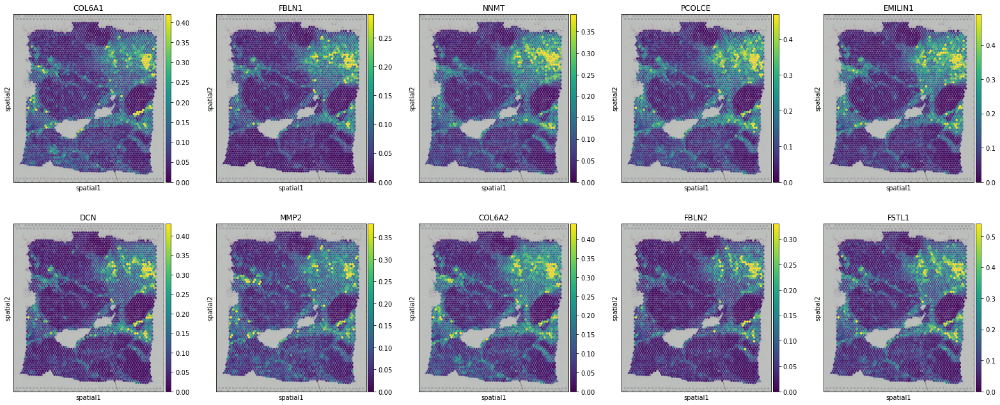

DCIS
['MIA', 'KLK5', 'KRT6B', 'LAMB3', 'KRT5', 'KRT14', 'PROM1', 'SERPINA3', 'MMP10', 'MMP7']


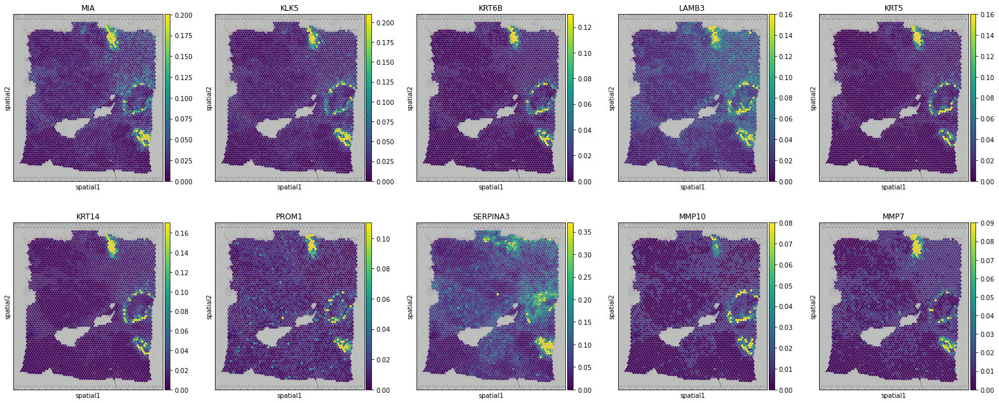

Invasive
['AC093001.1', 'SGCG', 'AC096585.1', 'AC105328.1', 'LINC02224', 'COX6C', 'SLC39A6', 'IL6ST', 'SCD', 'FASN']


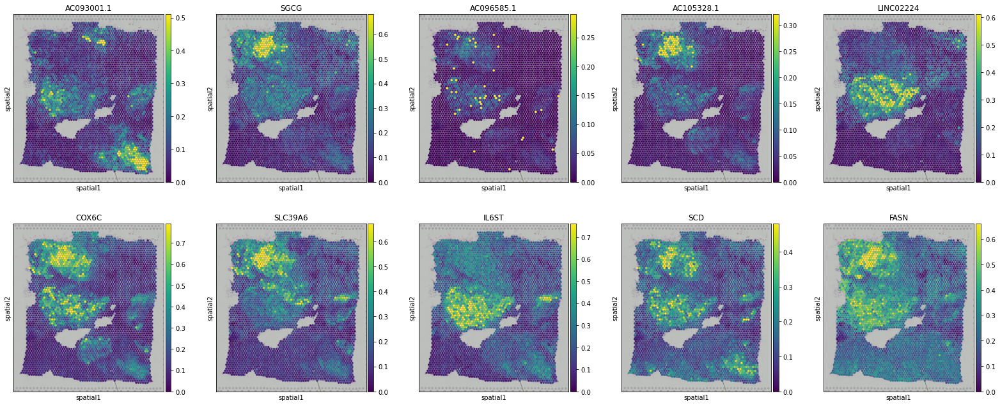

ACTA2+ Myoepi.
['PALD1', 'SLC9A3R2', 'TPM1', 'NUAK1', 'PTK7', 'THBS1', 'KLF10', 'C1orf21', 'PMEPA1', 'CARHSP1']


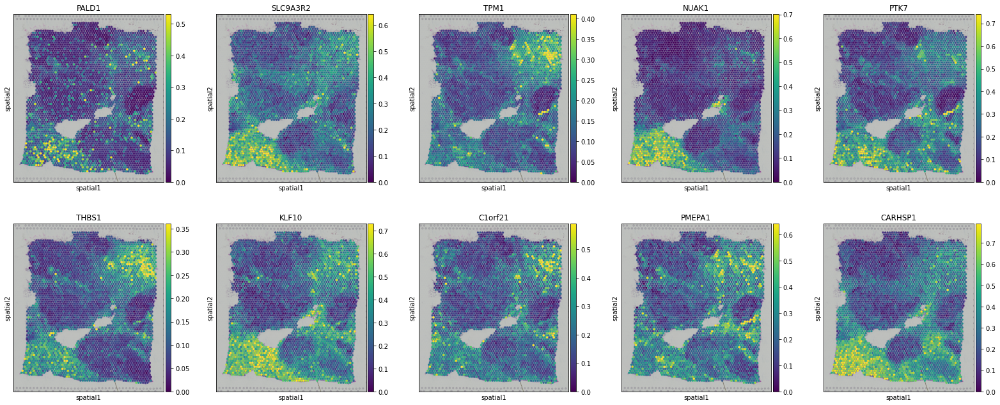

KRT15+ Myoepi.
['KLK11', 'MGP', 'FAM162A', 'STC2', 'PRDX4', 'ERP27', 'AC026355.3', 'DLX2', 'DSP', 'GPC3']


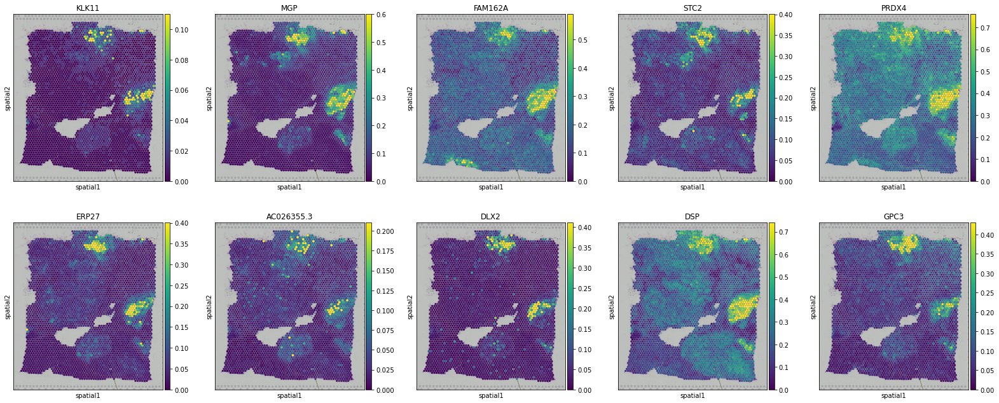

Endothelial
['MMRN1', 'NFIB', 'ZNF385D', 'CAVIN2', 'ERC1', 'ACKR1', 'CHST3', 'AQP1', 'CYB5R3', 'LIMS2']


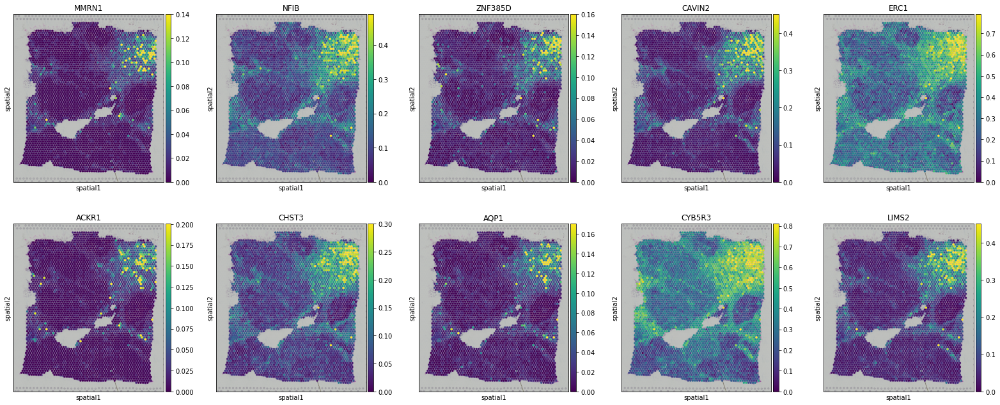

Macrophages
['MSR1', 'TREM2', 'OSCAR', 'APOE', 'FCER1G', 'FTL', 'IFI30', 'TMIGD3', 'LGMN', 'CD68']


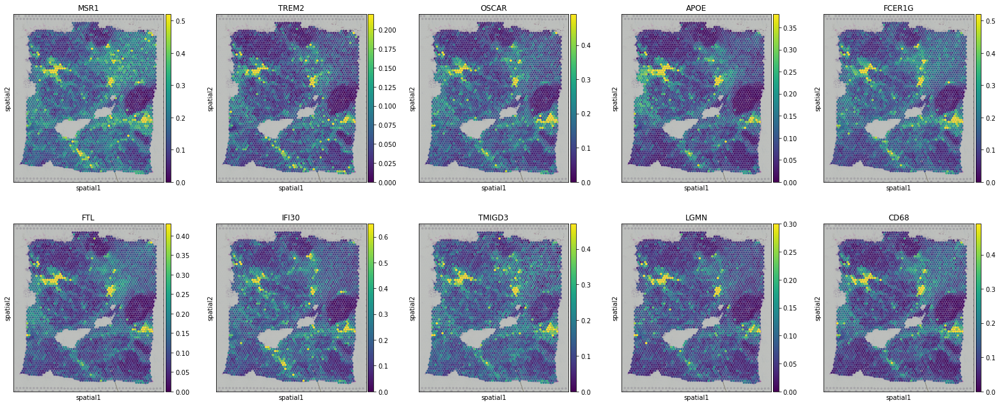

B Cell
['CD38', 'TENT5C', 'MEI1', 'AC012236.1', 'ITM2C', 'UBE2J1', 'SLAMF7', 'FAM30A', 'CD79A', 'IGHM']


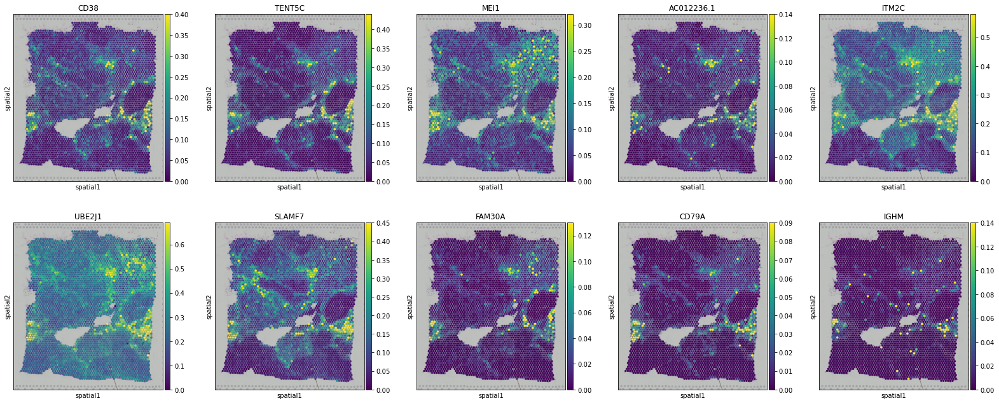

T Cell
['MIR155HG', 'IL2RB', 'CD48', 'LCP1', 'SLAMF7', 'HLA-F', 'CD247', 'CD8A', 'ADGRE5', 'GZMA']


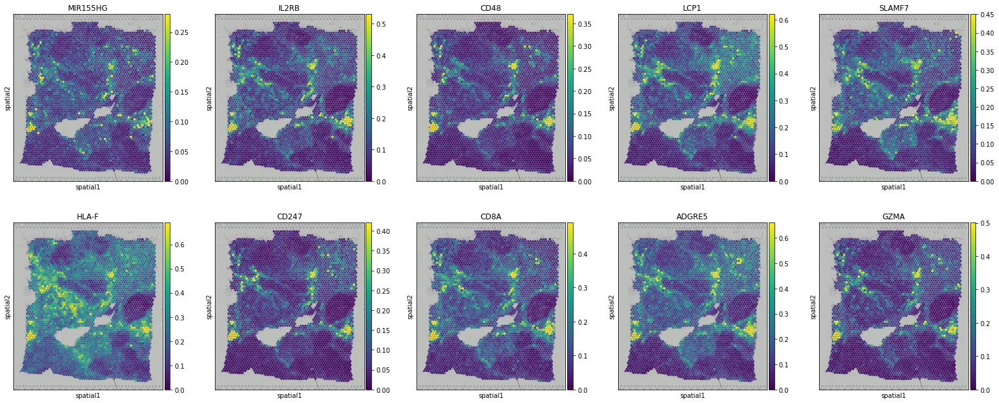

Mast Cell
['TPSAB1', 'IGLC2', 'IGHG3', 'IGHG1', 'IGKC', 'IGHG4', 'JCHAIN', 'TENT5C', 'DERL3', 'IGHA1']


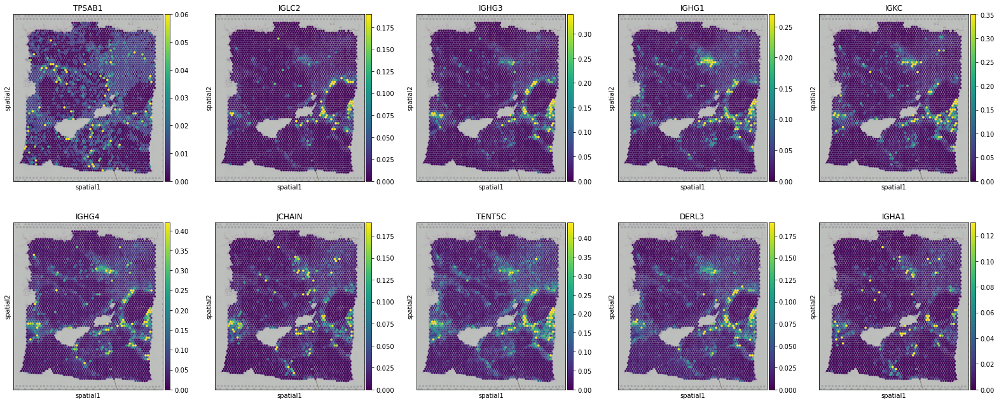

In [7]:
# Visualization of candidate marker genes
for k, v in Patterndict.items():
    print(k)
    print(v)
    with mpl.rc_context({'axes.facecolor':  'black',
                         'figure.figsize': [4.5, 5]}):
        sc.pl.spatial(adata, #cmap='magma',
                      layer='DenoisedX',
                      color=v,
                      ncols=5, size=1,
                      spot_size=250,
                      vmin=0, vmax='p99'
                     )

# Step3：Initial Pattern Recognition

In [8]:
# Construct the marker list by selecting 1-3 genes for each pattern 
# from the above candidate marker genes.
Patterndict = {
    'Stroma': ['MMP2', 'FBLN1'],
    'DCIS': ['SERPINA3', 'MGP'], 
    'Invasive': ['FASN', 'SCD'],
    'ACTA2+ Myoepi.': ['ACTA2'],
    'KRT15+ Myoepi.': ['KRT15', 'KRT5', 'KRT14'],   
    'Endothelial': ['AQP1', 'ACKR1', 'LIMS2'],
    'Macrophages': ['CD68','TREM2', 'APOE'],
    'B Cell': ['CD79A', 'MEI1'],
    'T Cell': ['CD8A', 'IL2RB', 'GZMA'],
    'Mast Cell': ['CPA3', 'JCHAIN', 'CTSG']
}

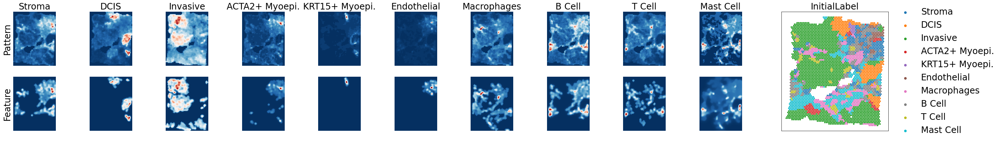

In [9]:
adata = po.AutoPatternRecognition(adata,
                                  Patterndict=Patterndict,
                                  config_path=config_path,
                                  param_tuning=False)

# Step4：Annotation Improvement

---Create Spatial Graph: Done!
---Compute Spatial Energy: Done!
---Find K-Nearest Neighbor in UMAP: Done!
---Compute KNN Energy: Done!
---Compute Global Energy: Done!


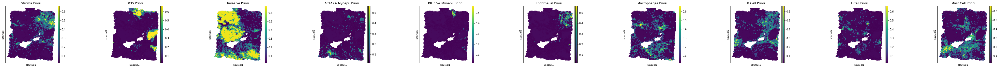

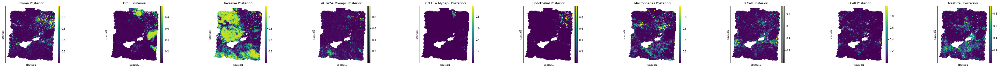

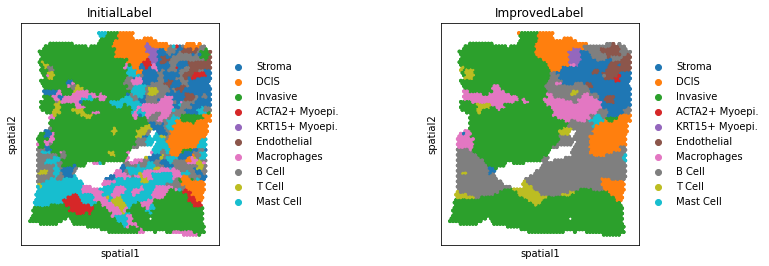

In [10]:
adata = po.AnnotationImprovement(adata)

---Create Spatial Graph: Done!
---Compute Spatial Energy: Done!
---Find K-Nearest Neighbor in UMAP: Done!
---Compute KNN Energy: Done!
---Compute Global Energy: Done!


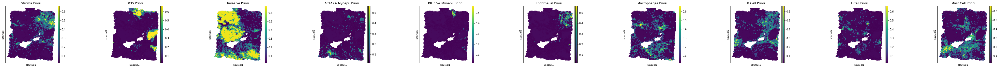

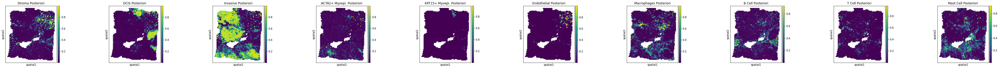

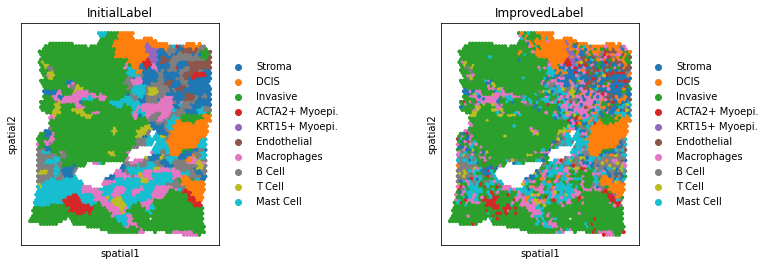

In [11]:
# If you want to preserve details, set the threshold of small objects to 0.
# If you want to annotate the cell type, it is recommended to use the "argmax" method.
# The "argmax" assigns cell types directly based on posterior probabilities, 
# to avoid excessive spatial smoothing and to preserve more details.
adata = po.AnnotationImprovement(adata,
                                 small_objects=0,
                                 method="argmax")